# Analyzing Crime Patterns in Vancouver Communities (2003-2016): Predicting Crime Incidents by Time and Location

In [60]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime, timedelta
import folium
from folium.plugins import HeatMap
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

sns.set_palette('husl')
pd.set_option('display.max_columns', None)

# 1. Data Cleaning and Analysis

## Data Structure

Data source: https://www.kaggle.com/datasets/wosaku/crime-in-vancouver/code

In this dataset, there are 12 columns, 5 columns are time related, 6 columns are location related, with one [TYPE] column.

We will use the time and location related columns to create features that we want, and the [TYPE] will be our target.

In [61]:
# Load data
df = pd.read_csv('crime.csv')

print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 530652 entries, 0 to 530651
Data columns (total 12 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   TYPE           530652 non-null  object 
 1   YEAR           530652 non-null  int64  
 2   MONTH          530652 non-null  int64  
 3   DAY            530652 non-null  int64  
 4   HOUR           476290 non-null  float64
 5   MINUTE         476290 non-null  float64
 6   HUNDRED_BLOCK  530639 non-null  object 
 7   NEIGHBOURHOOD  474028 non-null  object 
 8   X              530652 non-null  float64
 9   Y              530652 non-null  float64
 10  Latitude       530652 non-null  float64
 11  Longitude      530652 non-null  float64
dtypes: float64(6), int64(3), object(3)
memory usage: 48.6+ MB
None


In [62]:
df['TYPE'].value_counts()

TYPE
Theft from Vehicle                                        172700
Mischief                                                   70413
Break and Enter Residential/Other                          60862
Offence Against a Person                                   54142
Other Theft                                                52167
Theft of Vehicle                                           38418
Break and Enter Commercial                                 33845
Theft of Bicycle                                           25730
Vehicle Collision or Pedestrian Struck (with Injury)       21901
Vehicle Collision or Pedestrian Struck (with Fatality)       254
Homicide                                                     220
Name: count, dtype: int64

Summary: there are 11 Types in total in this dataset, we will try to predict which type is most likely to happenen given a specific time and location.

## Crime map in a specific year

In [63]:
df_crime = df.copy()

In [64]:
import geopandas as gpd
from folium.plugins import MarkerCluster
import ipywidgets as widgets
from IPython.display import display

gdf_crime = gpd.GeoDataFrame(df_crime, geometry=gpd.points_from_xy(df_crime.Longitude, df_crime.Latitude))
gdf_crime.crs = "EPSG:4326"

# Create basic Folium crime map
crime_map = folium.Map(location=[49.26, -123.1207], zoom_start=12., tiles='cartodbpositron', attr='CartoDB')

# Function to update the data points based on the selected year
def update_data_points(year):
    # Clear existing marker cluster layer
    crime_map.get_root().html.add_child(folium.Element("<script>document.getElementById('marker_cluster').remove();</script>"))

    # Filter data for the selected year
    data_points = gdf_crime[gdf_crime.YEAR == year]
    data_points = data_points[['Latitude', 'Longitude']]
    data_points = data_points.dropna(axis=0, subset=['Latitude', 'Longitude'])

    # Create and add marker cluster layer to the map
    marker_cluster = MarkerCluster(name='Crimes', id='marker_cluster')
    for _, row in data_points.iterrows():
        marker = folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            icon=None,
        )
        marker.add_to(marker_cluster)
    marker_cluster.add_to(crime_map)

# Dropdown widget for selecting the year
year_dropdown = widgets.Dropdown(
    options=list(range(2003, 2018)),
    value=2016,
    description='Year:',
    disabled=False,
)

# Event handler for the dropdown widget
def on_year_change(change):
    year = change.new
    update_data_points(year)

# Register the event handler
year_dropdown.observe(on_year_change, 'value')

# Display the dropdown widget
display(year_dropdown)

# Add initial data points to the map
update_data_points(year_dropdown.value)

# Display the map
crime_map


Dropdown(description='Year:', index=13, options=(2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2…

## Feature Engineering

In [65]:
print(df_crime.isnull().sum())

TYPE                 0
YEAR                 0
MONTH                0
DAY                  0
HOUR             54362
MINUTE           54362
HUNDRED_BLOCK       13
NEIGHBOURHOOD    56624
X                    0
Y                    0
Latitude             0
Longitude            0
dtype: int64


In [66]:
# Remove unnecessary columns
df_crime = df_crime.drop(['MINUTE'], axis=1)

# Fill in missing data
df_crime['HOUR'].fillna(25, inplace = True) 
df_crime['NEIGHBOURHOOD'].fillna('N/A', inplace = True)
df_crime['HUNDRED_BLOCK'].fillna('N/A', inplace = True)

# Separate the incomplete dataset 
df_2017 = df_crime[(df_crime['YEAR'] >= 2017)] 
df_crime = df_crime[(df_crime['YEAR'] < 2017)]

# Convert categorical columns into numerical columns
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df_crime['NeighbourhoodID'] = label_encoder.fit_transform(df_crime['NEIGHBOURHOOD'])
df_crime['CrimeTypeID'] = label_encoder.fit_transform(df_crime['TYPE'])

# Combine related features into a single feature
df_crime['Date'] = pd.to_datetime({'year':df_crime['YEAR'], 'month':df_crime['MONTH'], 'day':df_crime['DAY']})

# Add new features for further analysis
df_crime['Incident'] = 1 
df_crime['DayOfWeek'] = df_crime['Date'].dt.day_name()
df_crime['DayOfWeekID'] = df_crime['Date'].dt.weekday  # 0: Monday, 1:Tuesday, 2:Wednesday, 3:Thursday, 4:Friday, 5:Saturday, 6:Sunday

def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Fall'

df_crime['Season'] = df_crime['MONTH'].apply(get_season)
df_crime['SeasonID'] = label_encoder.fit_transform(df_crime['Season'])

df_crime['TimeOfDay'] = pd.cut(df_crime['HOUR'],
                                      bins=[0, 6, 12, 18, 24],
                                      labels=['Night (0-6)', 'Morning (6-12)', 'Afternoon (12-18)', 'Evening (18-24)'])
df_crime['TimeOfDayID'] = label_encoder.fit_transform(df_crime['TimeOfDay'])

df_crime.head()

C:\Users\Xuqiao Jiang\AppData\Local\Temp\ipykernel_19644\880456534.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_crime['HOUR'].fillna(25, inplace = True)
C:\Users\Xuqiao Jiang\AppData\Local\Temp\ipykernel_19644\880456534.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.



,TYPE,YEAR,MONTH,DAY,HOUR,HUNDRED_BLOCK,NEIGHBOURHOOD,X,Y,Latitude,Longitude,NeighbourhoodID,CrimeTypeID,Date,Incident,DayOfWeek,DayOfWeekID,Season,SeasonID,TimeOfDay,TimeOfDayID
0,Other Theft,2003,5,12,16.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,20,5,2003-05-12,1,Monday,0,Spring,1,Afternoon (12-18),0
1,Other Theft,2003,5,7,15.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,20,5,2003-05-07,1,Wednesday,2,Spring,1,Afternoon (12-18),0
2,Other Theft,2003,4,23,16.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,20,5,2003-04-23,1,Wednesday,2,Spring,1,Afternoon (12-18),0
3,Other Theft,2003,4,20,11.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,20,5,2003-04-20,1,Sunday,6,Spring,1,Morning (6-12),2
4,Other Theft,2003,4,12,17.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,20,5,2003-04-12,1,Saturday,5,Spring,1,Afternoon (12-18),0


In [67]:

df_crime['TimeOfDay'] = pd.cut(df_crime['HOUR'],
                                      bins=[0, 6, 12, 18, 24],
                                      labels=['Night (0-6)', 'Morning (6-12)', 'Afternoon (12-18)', 'Evening (18-24)'])

df_crime.head()

,TYPE,YEAR,MONTH,DAY,HOUR,HUNDRED_BLOCK,NEIGHBOURHOOD,X,Y,Latitude,Longitude,NeighbourhoodID,CrimeTypeID,Date,Incident,DayOfWeek,DayOfWeekID,Season,SeasonID,TimeOfDay,TimeOfDayID
0,Other Theft,2003,5,12,16.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,20,5,2003-05-12,1,Monday,0,Spring,1,Afternoon (12-18),0
1,Other Theft,2003,5,7,15.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,20,5,2003-05-07,1,Wednesday,2,Spring,1,Afternoon (12-18),0
2,Other Theft,2003,4,23,16.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,20,5,2003-04-23,1,Wednesday,2,Spring,1,Afternoon (12-18),0
3,Other Theft,2003,4,20,11.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,20,5,2003-04-20,1,Sunday,6,Spring,1,Morning (6-12),2
4,Other Theft,2003,4,12,17.0,9XX TERMINAL AVE,Strathcona,493906.5,5457452.47,49.269802,-123.083763,20,5,2003-04-12,1,Saturday,5,Spring,1,Afternoon (12-18),0


## Data Analysis

1. **Crime Type Distribution**  
   Analyze the total number of incidents for Each crime type
   **Time Period**: From 2003 to 2016

2. **Annual Trend of Total Crime Count**  
   Analyze the annual changes in the total number of crimes.  
   **Time Period**: From 2003 to 2016

3. **Crime Type Yearly Distribution**  
   Analyze the annual changes in the total number of incidents for each crime type.  
   **Time Period**: From 2003 to 2016

4. **Total Crime by Day of the Week/Season/Time of the Day**  

5. **Crime Spatiotemporal Analysis**

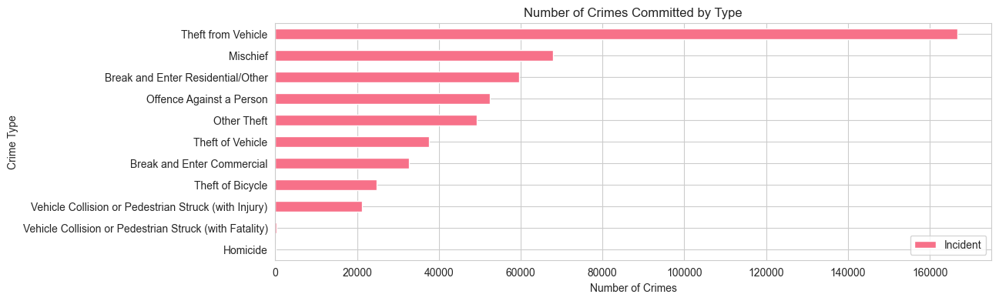

In [68]:
# Crime Type Distribution
df_Crime_Type = pd.pivot_table(df_crime, values=["Incident"],index = ["TYPE"], aggfunc='count')

df_Crime_Type = df_Crime_Type.sort_values(['Incident'], ascending=True)

# Create bar graph for number of crimes by Type of Crime
crime_plot = df_Crime_Type.plot(kind='barh',
               figsize = (12,4),
               title='Number of Crimes Committed by Type'
             )

plt.rcParams["figure.dpi"] = 100
plt.legend(loc='lower right')
plt.ylabel('Crime Type')
plt.xlabel('Number of Crimes')
plt.show(crime_plot)

Observation: Theft from Vehicles is the most common type of crime, and it's total count is significantly greater than others.

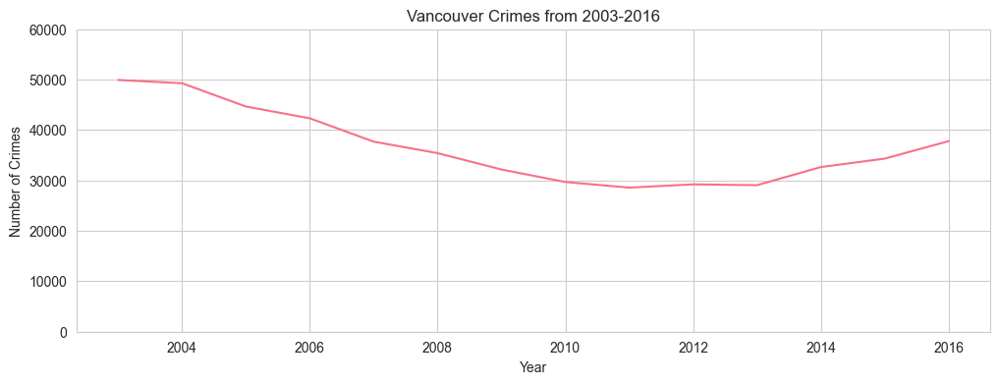

In [69]:
# Annual Trend of Total Crime Count

sns.set_style("whitegrid")

# Count all crimes and group by year
df_Crime_Year = pd.pivot_table(df_crime, values=["Incident"],index = ["YEAR"], aggfunc='count')

# Graph results of Year by Crimes
f, ax = plt.subplots(1,1, figsize = (12, 4), dpi=100)
X = df_Crime_Year.index
y = df_Crime_Year
ax.plot(X, y)
ax.set_ylim(ymin=0, ymax=60000)
plt.xlabel('Year')
plt.ylabel('Number of Crimes')
plt.title('Vancouver Crimes from 2003-2016')
plt.show()

Observation: The total number of crimes declined from 2003 to 2011, stayed stable until 2013, and then started to rise again.

### What might be the factors behind this decline and rise?

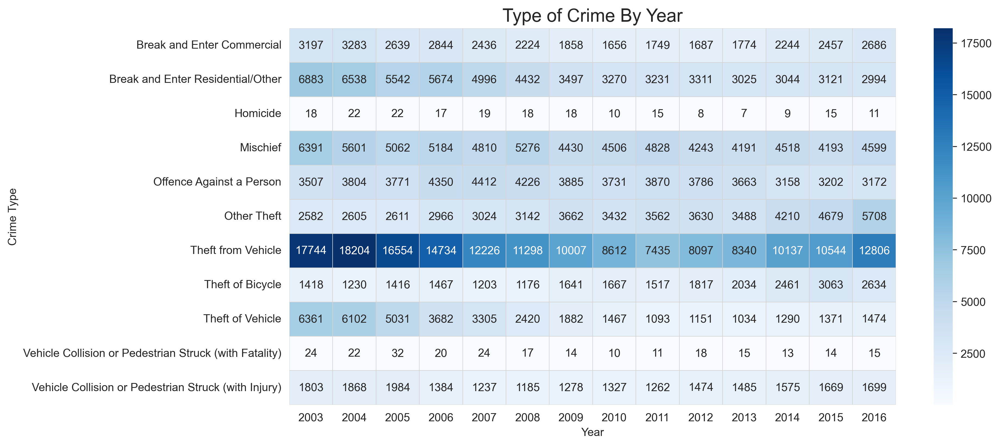

In [70]:
# Crime Type Yearly Distribution

df_Piv_Year = df_crime.pivot_table(values='Incident', index='TYPE', columns='YEAR', aggfunc=len)

fig, ax = plt.subplots(1, 1, figsize = (12, 6), dpi=300)
plt.title('Type of Crime By Year', fontsize=16)
plt.tick_params(labelsize=10)

sns.heatmap(
    df_Piv_Year.round(), 
    linecolor='lightgrey', 
    linewidths=0.1,
    cmap='Blues',
    annot=True, 
    fmt=".0f"
);

ax.set_ylabel('Crime Type')    
ax.set_xlabel('Year')

plt.show()

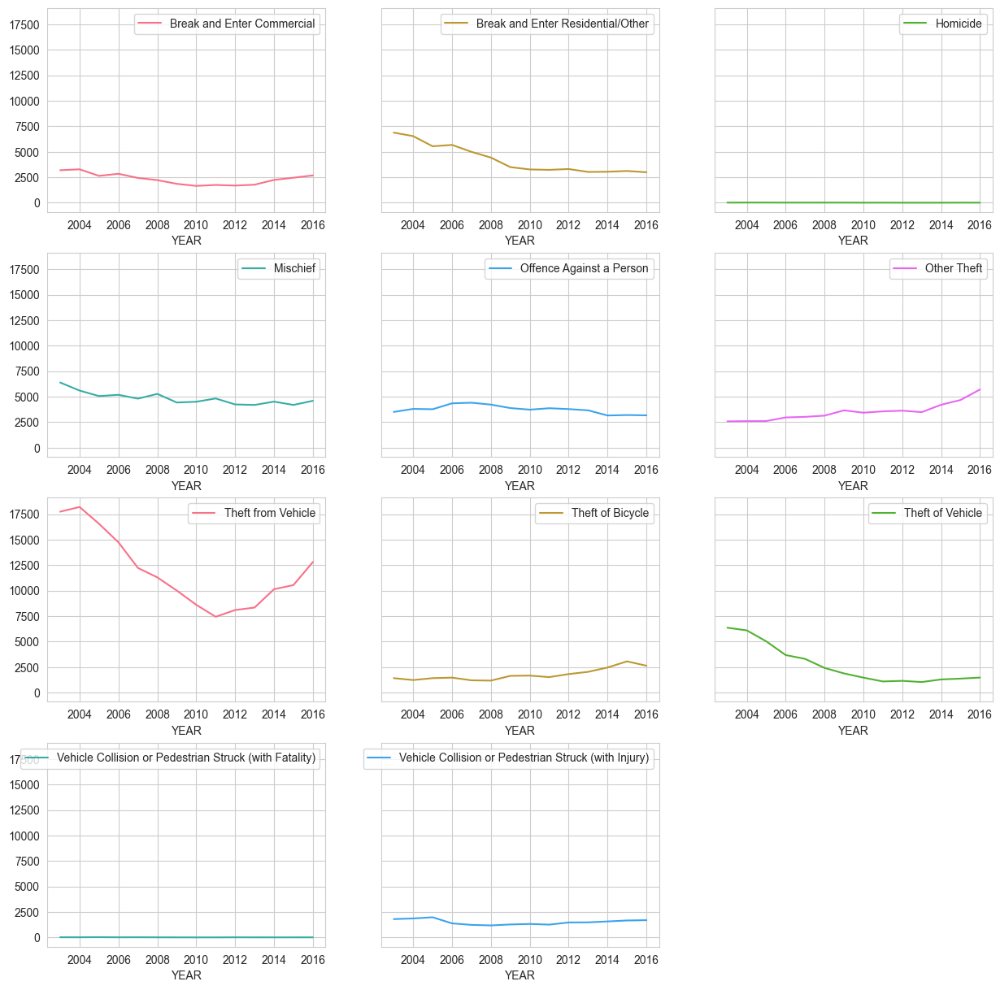

In [71]:
# Crime count by Category per year
dfPivCrimeDate = df_crime.pivot_table(values='Incident'
                                     ,aggfunc=np.size
                                     ,columns='TYPE'
                                     ,index='YEAR'
                                     ,fill_value=0)
plo = dfPivCrimeDate.plot(figsize=(15, 15), subplots=True, layout=(-1, 3), sharex=False, sharey=True)

Observation: the property-related crimes, like theft from&of Vehicle and break-ins are the main contributors to the decline and rise in crime trends, while serious crimes like homicide and vehicle collisions have stayed stable. 

Assumption: The economy might be the biggest factor influencing crime.


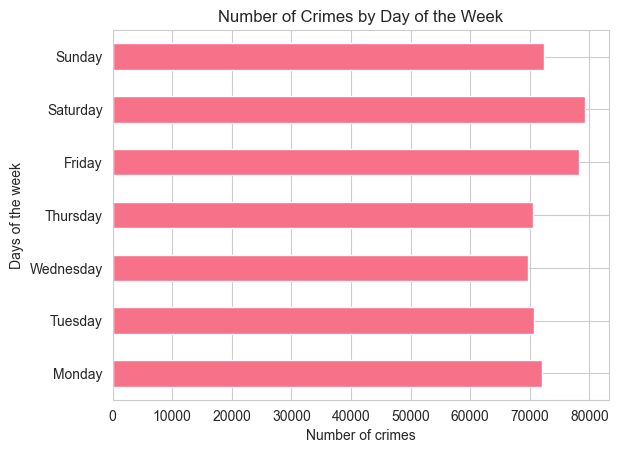

In [72]:
# Total Crime by Day of the Week
days = ['Monday','Tuesday','Wednesday',  'Thursday', 'Friday', 'Saturday', 'Sunday']

# Grouping dataframe by Day of Week ID and plotting
df_crime.groupby(df_crime["DayOfWeekID"]).size().plot(kind='barh')

# Customizing Plot 
plt.ylabel('Days of the week')
plt.yticks(np.arange(7), days)
plt.xlabel('Number of crimes')
plt.title('Number of Crimes by Day of the Week')
plt.show()


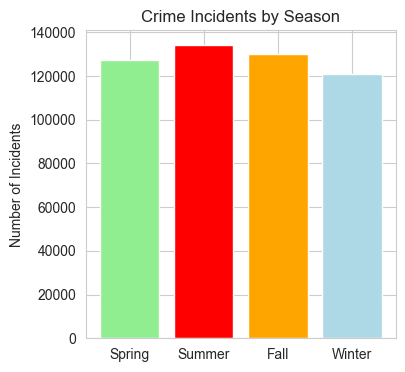

In [73]:
plt.figure(figsize=(4, 4))
seasonal_data = df_crime['Season'].value_counts()
seasonal_order = ['Spring', 'Summer', 'Fall', 'Winter']
seasonal_data = seasonal_data.reindex(seasonal_order)

plt.bar(seasonal_data.index, 
        seasonal_data.values, 
        color=['lightgreen', 'red', 'orange', 'lightblue'])
plt.title('Crime Incidents by Season')
plt.ylabel('Number of Incidents')

plt.show()

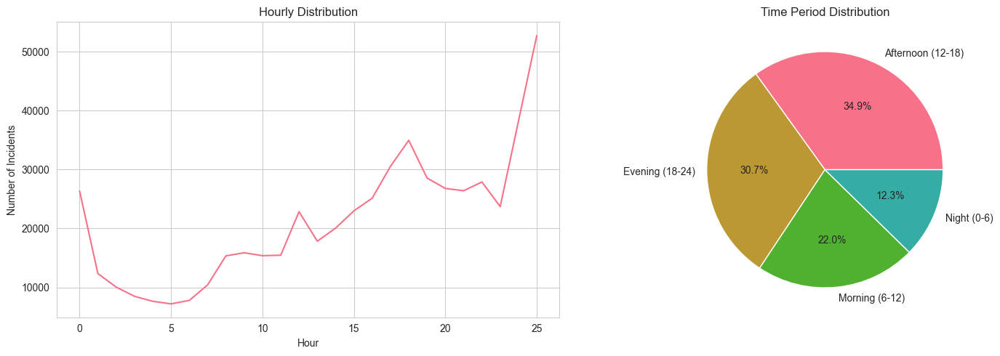

In [74]:
# Analyze time distribution
plt.figure(figsize=(15, 5))

# Drop empty values
df_crime = df_crime.dropna(subset=['HOUR'])

# Hourly distribution
plt.subplot(1, 2, 1)
hourly_counts = df_crime['HOUR'].value_counts().sort_index()
sns.lineplot(x=hourly_counts.index, y=hourly_counts.values)
plt.title('Hourly Distribution')
plt.xlabel('Hour')
plt.ylabel('Number of Incidents')

# Time period distribution
plt.subplot(1, 2, 2)
time_period_counts = df_crime['TimeOfDay'].value_counts()
plt.pie(time_period_counts, labels=time_period_counts.index, autopct='%1.1f%%')
plt.title('Time Period Distribution')

plt.tight_layout()
plt.show()

Observation: 
- the number of crimes tends to be higher on Fridays and Saturdays.
- crime happens less often in winter and spring compared to summer and fall
- crime is more likely to happen around noon, dinner time, and midnight

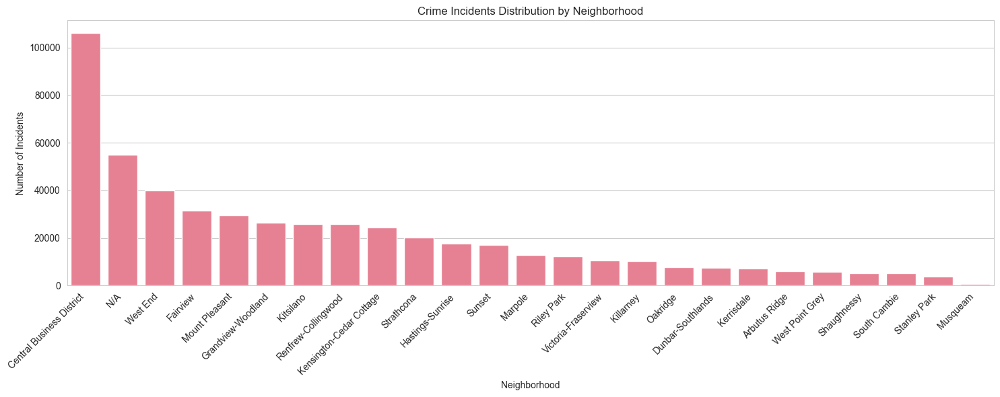

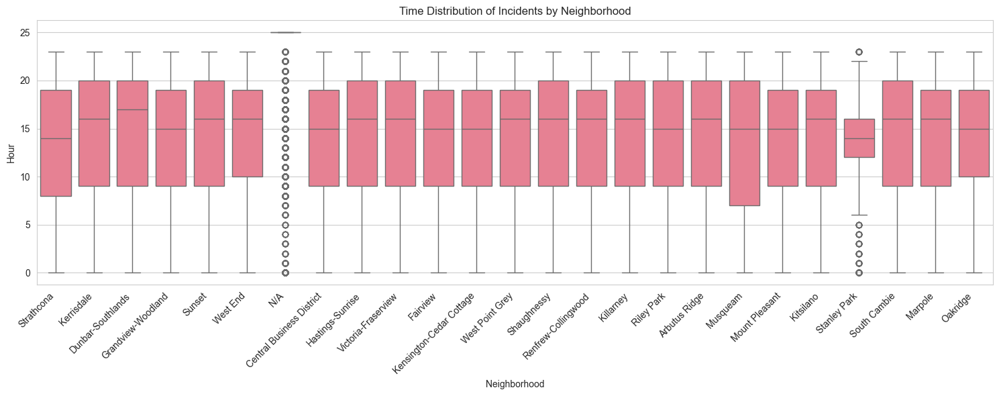

In [75]:
df_copy = df_crime.copy()
# Calculate neighborhood-level statistics
neighborhood_stats = df_copy.groupby('NEIGHBOURHOOD').agg({
    'TYPE': 'count',                   # Total incidents
    'HOUR': ['mean', 'std'],           # Average time and std
}).round(3)

# Rename columns
neighborhood_stats.columns = ['Total Incidents', 'Average Time', 'Time Std']

# Visualize neighborhood incident distribution
plt.figure(figsize=(15, 6))
sns.barplot(x=neighborhood_stats.index, 
           y=neighborhood_stats['Total Incidents'],
           order=neighborhood_stats.sort_values('Total Incidents', ascending=False).index)
plt.title('Crime Incidents Distribution by Neighborhood')
plt.xlabel('Neighborhood')
plt.ylabel('Number of Incidents')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Analyze neighborhood time patterns
plt.figure(figsize=(15, 6))
sns.boxplot(x='NEIGHBOURHOOD', y='HOUR', data=df_copy)
plt.title('Time Distribution of Incidents by Neighborhood')
plt.xlabel('Neighborhood')
plt.ylabel('Hour')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Observation:
- Central Bussiness District is the most dangerous place.
- Crimes are tend to happen in the afternoon no matter where it will happen.

# 2. Data Mining

In [76]:
df_crime.info()

<class 'pandas.core.frame.DataFrame'>
Index: 512795 entries, 0 to 512794
Data columns (total 21 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   TYPE             512795 non-null  object        
 1   YEAR             512795 non-null  int64         
 2   MONTH            512795 non-null  int64         
 3   DAY              512795 non-null  int64         
 4   HOUR             512795 non-null  float64       
 5   HUNDRED_BLOCK    512795 non-null  object        
 6   NEIGHBOURHOOD    512795 non-null  object        
 7   X                512795 non-null  float64       
 8   Y                512795 non-null  float64       
 9   Latitude         512795 non-null  float64       
 10  Longitude        512795 non-null  float64       
 11  NeighbourhoodID  512795 non-null  int32         
 12  CrimeTypeID      512795 non-null  int32         
 13  Date             512795 non-null  datetime64[ns]
 14  Incident         512795 n

## Dummy Classifier

In [77]:
from sklearn.dummy import DummyClassifier

df_dummy = df_crime.copy()
df_dummy = df_dummy.dropna(subset=['NEIGHBOURHOOD'])

features = ['YEAR', 'MONTH', 'DAY', 'HOUR', 'NeighbourhoodID', 'Latitude', 'Longitude','DayOfWeekID']
X = df_dummy[features]
y = df_dummy['CrimeTypeID']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

dummy_classfier_freq = DummyClassifier(strategy='most_frequent')
dummy_classfier_freq.fit(X_train, y_train)

score_dummy_freq = dummy_classfier_freq.score(X_test, y_test)
score_dummy_freq

0.3245643970787547

## Random Forest

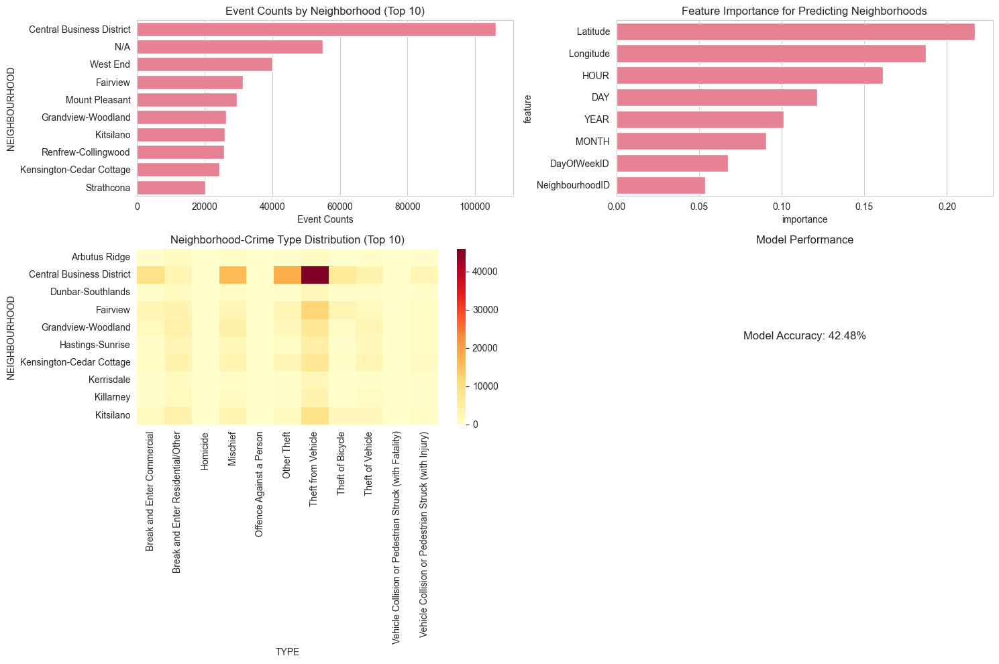

In [ ]:
from sklearn.ensemble import RandomForestClassifier

df_rf = df_crime.copy()

features = ['YEAR', 'MONTH', 'DAY', 'HOUR', 'NeighbourhoodID', 'Latitude', 'Longitude','DayOfWeekID']
X = df_rf[features]
y = df_rf['CrimeTypeID']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the Random Forest model
rf_model = RandomForestClassifier(
    n_estimators=500,
    max_depth=20,
    min_samples_split=30,
    min_samples_leaf=15,
    max_features='sqrt',
    class_weight='balanced',
    random_state=42,
    max_samples=0.6
)
rf_model.fit(X_train, y_train)

# Predict and evaluate
y_pred = rf_model.predict(X_test)

# Analyze feature importance
feature_importance = pd.DataFrame({
    'feature': features,
    'importance': rf_model.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

# Visualize
plt.figure(figsize=(15, 10))

# 1. Event Counts by Neighborhood (Top 10)
plt.subplot(2, 2, 1)
neighborhood_counts = df_rf['NEIGHBOURHOOD'].value_counts()
sns.barplot(x=neighborhood_counts.values[:10], y=neighborhood_counts.index[:10])
plt.title('Event Counts by Neighborhood (Top 10)')
plt.xlabel('Event Counts')

# 2. Feature Importance for Predicting Neighborhoods    
plt.subplot(2, 2, 2)
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('Feature Importance for Predicting Neighborhoods')

# 3. Neighborhood-Crime Type Distribution (Top 10)
plt.subplot(2, 2, 3)
neighborhood_type_pivot = pd.crosstab(df_rf['NEIGHBOURHOOD'], df_rf['TYPE'])
sns.heatmap(neighborhood_type_pivot.head(10), cmap='YlOrRd')
plt.title('Neighborhood-Crime Type Distribution (Top 10)')

# 4. Model Accuracy
plt.subplot(2, 2, 4)
accuracy = rf_model.score(X_test, y_test)
plt.text(0.5, 0.5, f'Model Accuracy: {accuracy:.2%}', 
         horizontalalignment='center', verticalalignment='center', fontsize=12)
plt.axis('off')
plt.title('Model Performance')

plt.tight_layout()
plt.show()


## Decision Tree

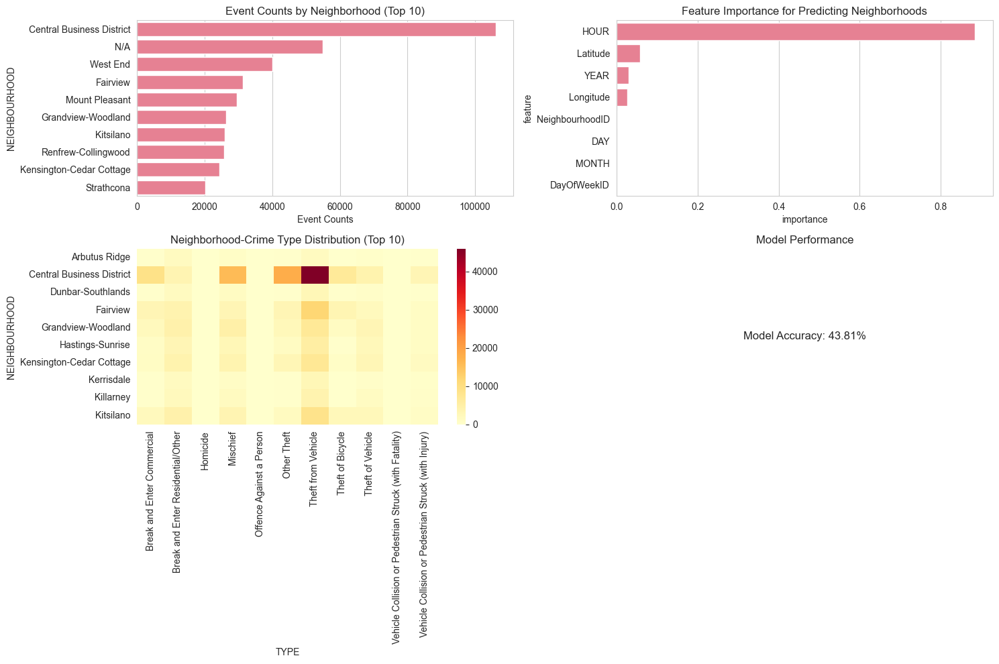

In [82]:
from sklearn.tree import DecisionTreeClassifier

df_dt = df_crime.copy()

clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 5,
                               max_depth=5, min_samples_leaf=8)
clf_gini.fit(X_train, y_train)

# Predict and evaluate
y_pred = clf_gini.predict(X_test)

# Analyze feature importance
feature_importance = pd.DataFrame({
    'feature': features,
    'importance': clf_gini.feature_importances_
})
feature_importance = feature_importance.sort_values('importance', ascending=False)

# Visualize
plt.figure(figsize=(15, 10))

# 1. Event Counts by Neighborhood (Top 10)
plt.subplot(2, 2, 1)
neighborhood_counts = df_dt['NEIGHBOURHOOD'].value_counts()
sns.barplot(x=neighborhood_counts.values[:10], y=neighborhood_counts.index[:10])
plt.title('Event Counts by Neighborhood (Top 10)')
plt.xlabel('Event Counts')

# 2. Feature Importance for Predicting Neighborhoods    
plt.subplot(2, 2, 2)
sns.barplot(x='importance', y='feature', data=feature_importance)
plt.title('Feature Importance for Predicting Neighborhoods')

# 3. Neighborhood-Crime Type Distribution (Top 10)
plt.subplot(2, 2, 3)
neighborhood_type_pivot = pd.crosstab(df_dt['NEIGHBOURHOOD'], df_dt['TYPE'])
sns.heatmap(neighborhood_type_pivot.head(10), cmap='YlOrRd')
plt.title('Neighborhood-Crime Type Distribution (Top 10)')

# 4. Model Accuracy
plt.subplot(2, 2, 4)
accuracy = clf_gini.score(X_test, y_test)
plt.text(0.5, 0.5, f'Model Accuracy: {accuracy:.2%}', 
         horizontalalignment='center', verticalalignment='center', fontsize=12)
plt.axis('off')
plt.title('Model Performance')

plt.tight_layout()
plt.show()

## Logistic Regression
Refined Total number of predicted categories

In [85]:
crime_category = {
    'Theft from Vehicle': 'Theft',
    'Other Theft': 'Theft',
    'Mischief': 'Mischief',
    'Offence Against a Person': 'Against',
    'Break and Enter Residential/Other': 'Break and Enter',
    'Break and Enter Commercial': 'Break and Enter',
    'Theft of Vehicle': 'Theft',
    'Theft of Bicycle': 'Theft',
    'Vehicle Collision or Pedestrian Struck (with Injury)': 'Vehicle Collision',
    'Vehicle Collision or Pedestrian Struck (with Fatality)': 'Vehicle Collision',
    'Homicide': 'Homicide'
}

df_crime['category'] = df_crime['TYPE'].map(crime_category)

df_crime['category'].value_counts()

category
Theft                278446
Break and Enter       92292
Mischief              67832
Against               52537
Vehicle Collision     21479
Homicide                209
Name: count, dtype: int64

In [96]:
df_crime.info()

<class 'pandas.core.frame.DataFrame'>
Index: 512795 entries, 0 to 512794
Data columns (total 22 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   TYPE             512795 non-null  object        
 1   YEAR             512795 non-null  int64         
 2   MONTH            512795 non-null  int64         
 3   DAY              512795 non-null  int64         
 4   HOUR             512795 non-null  float64       
 5   HUNDRED_BLOCK    512795 non-null  object        
 6   NEIGHBOURHOOD    512795 non-null  object        
 7   X                512795 non-null  float64       
 8   Y                512795 non-null  float64       
 9   Latitude         512795 non-null  float64       
 10  Longitude        512795 non-null  float64       
 11  NeighbourhoodID  512795 non-null  int32         
 12  CrimeTypeID      512795 non-null  int32         
 13  Date             512795 non-null  datetime64[ns]
 14  Incident         512795 n

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

df_model = df_crime.copy()
df_model.drop(columns=['X', 'Y', 'Latitude', 'Longitude', 'HUNDRED_BLOCK','TYPE','YEAR','DayOfWeek', 'DAY', 'Date', 'NeighbourhoodID', 'CrimeTypeID', 'Incident' ], inplace=True)

features = ['NEIGHBOURHOOD', 'TimeOfDay', 'Season', 'DayOfWeekID']

data_encoded = pd.get_dummies(df_model, columns=features)

label_encoder = LabelEncoder()
data_encoded['category_encoded'] = label_encoder.fit_transform(df_model['category'])

X = data_encoded.drop(columns=['category', 'category_encoded'])
y = data_encoded['category_encoded']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

model = LogisticRegression(max_iter=10000, random_state=42)
model.fit(X_train, y_train)

score = model.score(X_train, y_train)

print("Accuracy:", score)
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_,
                          zero_division=1))

Accuracy: 0.6458087539855107

Classification Report:
                   precision    recall  f1-score   support

          Against       1.00      1.00      1.00     10573
  Break and Enter       0.38      0.12      0.18     18536
         Homicide       1.00      0.00      0.00        34
         Mischief       0.28      0.00      0.00     13599
            Theft       0.62      0.96      0.75     55459
Vehicle Collision       1.00      0.00      0.00      4358

         accuracy                           0.64    102559
        macro avg       0.71      0.35      0.32    102559
     weighted avg       0.59      0.64      0.54    102559



In [102]:
from sklearn.dummy import DummyClassifier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

dummy_classfier_freq = DummyClassifier(strategy='most_frequent')
dummy_classfier_freq.fit(X_train, y_train)

score_dummy_freq = dummy_classfier_freq.score(X_test, y_test)
score_dummy_freq

0.5407521524195829

In [104]:
from sklearn.tree import DecisionTreeClassifier

df_dt = df_crime.copy()

clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 5,
                               max_depth=5, min_samples_leaf=8)
clf_gini.fit(X_train, y_train)

score = clf_gini.score(X_train, y_train)

score

0.6507961271073236

[[10573     0     0     0     0     0]
 [    0  2049     0     0 16487     0]
 [   34     0     0     0     0     0]
 [    0   990     0     0 12609     0]
 [    0  1458     0     0 54001     0]
 [    0   166     0     0  4192     0]]
['Theft' 'Break and Enter' 'Mischief' 'Against' 'Vehicle Collision'
 'Homicide']
['Theft' 'Break and Enter' 'Mischief' 'Against' 'Vehicle Collision'
 'Homicide']


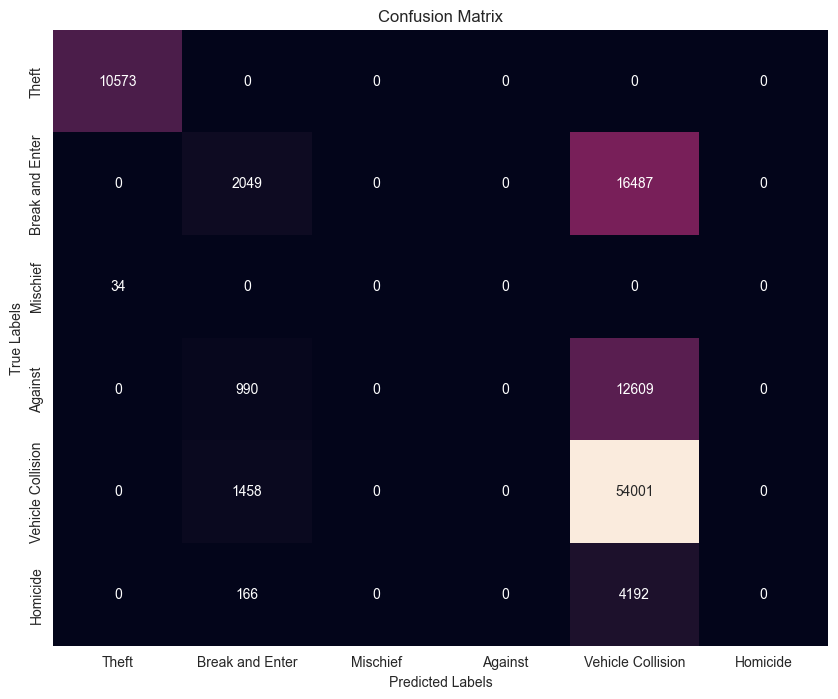

In [105]:
from sklearn.metrics import confusion_matrix

y_pred = clf_gini.predict(X_test)
conf_matrix = confusion_matrix(y_test, y_pred)
print(conf_matrix)
labels = data_encoded['category'].unique()
print(labels)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cbar=False)
labels = data_encoded['category'].unique()
print(labels)
# Add labels, title, and axis ticks
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.xticks(ticks=np.arange(len(labels)) + 0.5, labels= labels)
plt.yticks(ticks=np.arange(len(labels)) + 0.5, labels= labels)

plt.show()

In [106]:
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_,
                          zero_division=1))


Classification Report:
                   precision    recall  f1-score   support

          Against       1.00      1.00      1.00     10573
  Break and Enter       0.44      0.11      0.18     18536
         Homicide       1.00      0.00      0.00        34
         Mischief       1.00      0.00      0.00     13599
            Theft       0.62      0.97      0.76     55459
Vehicle Collision       1.00      0.00      0.00      4358

         accuracy                           0.65    102559
        macro avg       0.84      0.35      0.32    102559
     weighted avg       0.69      0.65      0.54    102559

